In [24]:
library(tidyverse)
library(ggpubr)
library(reshape2)


Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths




Load the "cleaned" data with the labels:

In [2]:
AML = read_csv('../data/cleaned_data.csv')

Parsed with column specification:
cols(
  .default = col_double(),
  category_name = col_character()
)

See spec(...) for full column specifications.



In [ ]:
names(AML)

In [3]:
labels = read_csv('../data/jeopardy.csv')

Parsed with column specification:
cols(
  cif = col_double(),
  suspicious = col_double()
)



In [ ]:
nrow(labels)
nrow(AML)

In [5]:
AML = AML %>% 
merge(labels, by = 'cif', all.x = T)
dim(AML)

[1] 999232     33

In [19]:
columns_to_remove = c('turnover','atm_withdrawal','atm_deposit',
                      'transaction_count', 'nationality',
                      'atm_deposit_norm','atm_withdrawal_norm','category','is_pep','nationality','new_category')
names(AML)
all(columns_to_remove %in% names(AML))

[1] "cif"                         "category"                   
 [3] "turnover"                    "transaction_count"          
 [5] "io_ratio"                    "age"                        
 [7] "nationality"                 "is_pep"                     
 [9] "inactive_days_average"       "inactive_days_max"          
[11] "n_of_accounts"               "distinct_counterparties"    
[13] "channel_risk"                "atm_withdrawal"             
[15] "atm_deposit"                 "country_score"              
[17] "country_ranking"             "atm_withdrawal_norm"        
[19] "atm_deposit_norm"            "transaction_avg"            
[21] "turnover_log"                "atm_withdrawal_log"         
[23] "atm_deposit_log"             "transaction_count_log"      
[25] "distinct_counterparties_log" "atm_withdrawal_norm_log"    
[27] "atm_deposit_norm_log"        "inactive_days_average_log"  
[29] "new_category"                "category_name"              
[31] "no_atm_deposit"              "no_atm_withdrawal"          
[33] "suspicious"

[1] TRUE

In [87]:
AML_loged = AML %>%
  column_to_rownames(var = 'cif') %>%
  select(-one_of(columns_to_remove))%>%
    mutate(suspicious = as.factor(suspicious),
          no_atm_deposit= as.factor(no_atm_deposit),
           no_atm_withdrawal= as.factor(no_atm_withdrawal))

In [26]:
dim(AML_loged)

[1] 999232     22

In [27]:
categorical_columns = c('category_name','suspicious','no_atm_deposit','no_atm_withdrawal')
other_columns = setdiff(names(AML_loged),categorical_columns)
other_columns
length(other_columns)
col_combinations = t(combn(other_columns, 2))
col_combinations

[1] "io_ratio"                    "age"                        
 [3] "inactive_days_average"       "inactive_days_max"          
 [5] "n_of_accounts"               "distinct_counterparties"    
 [7] "channel_risk"                "country_score"              
 [9] "country_ranking"             "transaction_avg"            
[11] "turnover_log"                "atm_withdrawal_log"         
[13] "atm_deposit_log"             "transaction_count_log"      
[15] "distinct_counterparties_log" "atm_withdrawal_norm_log"    
[17] "atm_deposit_norm_log"        "inactive_days_average_log"

[1] 18

io_ratio,age
io_ratio,inactive_days_average
io_ratio,inactive_days_max
io_ratio,n_of_accounts
io_ratio,distinct_counterparties
io_ratio,channel_risk
io_ratio,country_score
io_ratio,country_ranking
io_ratio,transaction_avg
io_ratio,turnover_log
io_ratio,atm_withdrawal_log


Exploratory plots (boxplots)

In [80]:
AML_long = AML_loged %>%
    rownames_to_column(var = "cif") %>%
    melt(id.vars = c('cif',categorical_columns)) %>%
    mutate(suspicious = as.factor(suspicious),
          no_atm_deposit= as.factor(no_atm_deposit),
           no_atm_withdrawal= as.factor(no_atm_withdrawal))
sapply(AML_long, class)
dim(AML_long)

cif     category_name        suspicious    no_atm_deposit 
      "character"       "character"          "factor"          "factor" 
no_atm_withdrawal          variable             value 
         "factor"          "factor"         "numeric"

[1] 17986176        7

In [36]:
names(AML_long)

[1] "category_name"     "suspicious"        "no_atm_deposit"   
[4] "no_atm_withdrawal" "variable"          "value"

In [49]:
densplot_list = lapply(other_columns, function(x){
    ggplot(AML_long %>% filter(variable == x), 
           aes(x = value, color = category_name, fill = category_name)) +
geom_density(alpha = .3) +
ggtitle(x)+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))
})


Warning message:
“Removed 456939 rows containing non-finite values (stat_density).”
Warning message:
“Removed 456939 rows containing non-finite values (stat_density).”


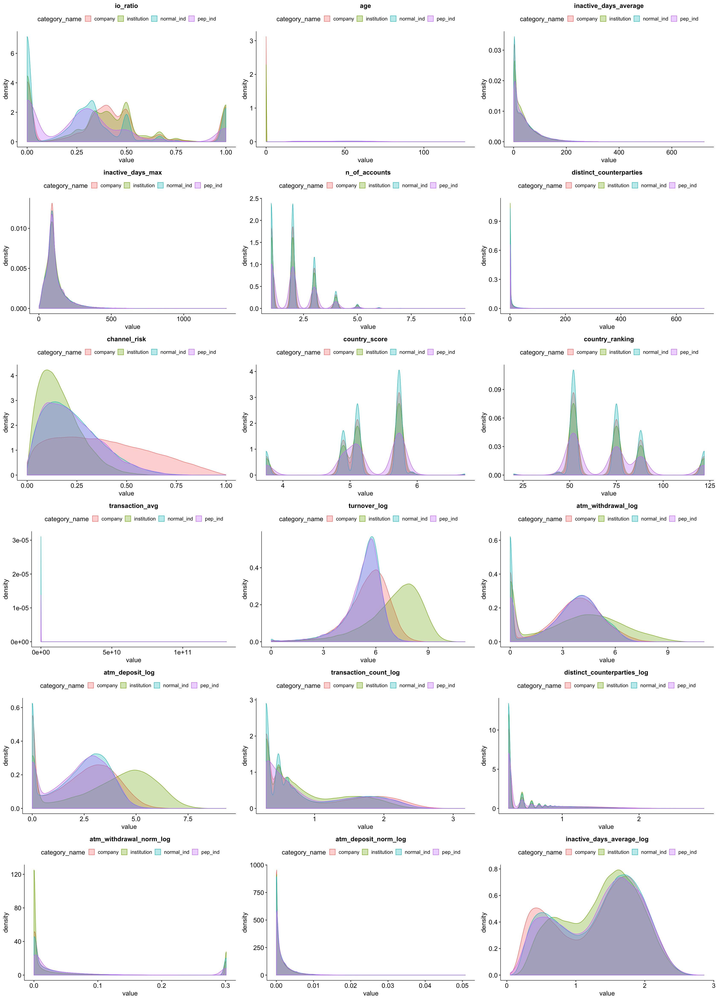

In [53]:
options(repr.plot.width = 28, repr.plot.height = 39)
ggarrange(plotlist=densplot_list, ncol = 3, nrow = 6)

In [65]:
densplot_list_suspicious = lapply(other_columns, function(x){
    ggplot(AML_long %>% filter(variable == x), 
           aes(x = value, color = suspicious, fill = suspicious)) +
geom_density(alpha = .3) +
ggtitle(x)+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))
})

Warning message:
“Removed 456939 rows containing non-finite values (stat_density).”
Warning message:
“Removed 456939 rows containing non-finite values (stat_density).”


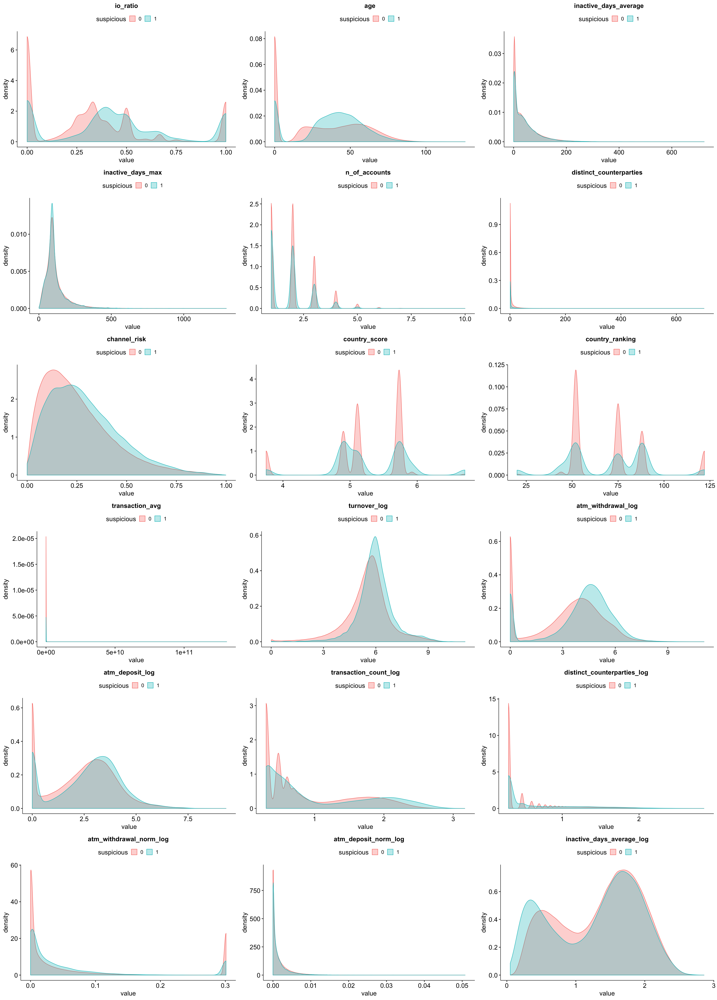

In [66]:
options(repr.plot.width = 28, repr.plot.height = 39)
ggarrange(plotlist=densplot_list_suspicious, ncol = 3, nrow = 6)

In [67]:
densplot_list_atm_withdrawal = lapply(other_columns, function(x){
    ggplot(AML_long %>% filter(variable == x), 
           aes(x = value, color = no_atm_withdrawal, fill = no_atm_withdrawal)) +
geom_density(alpha = .3) +
ggtitle(x)+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))
})

Warning message:
“Removed 456939 rows containing non-finite values (stat_density).”
Warning message:
“Removed 456939 rows containing non-finite values (stat_density).”


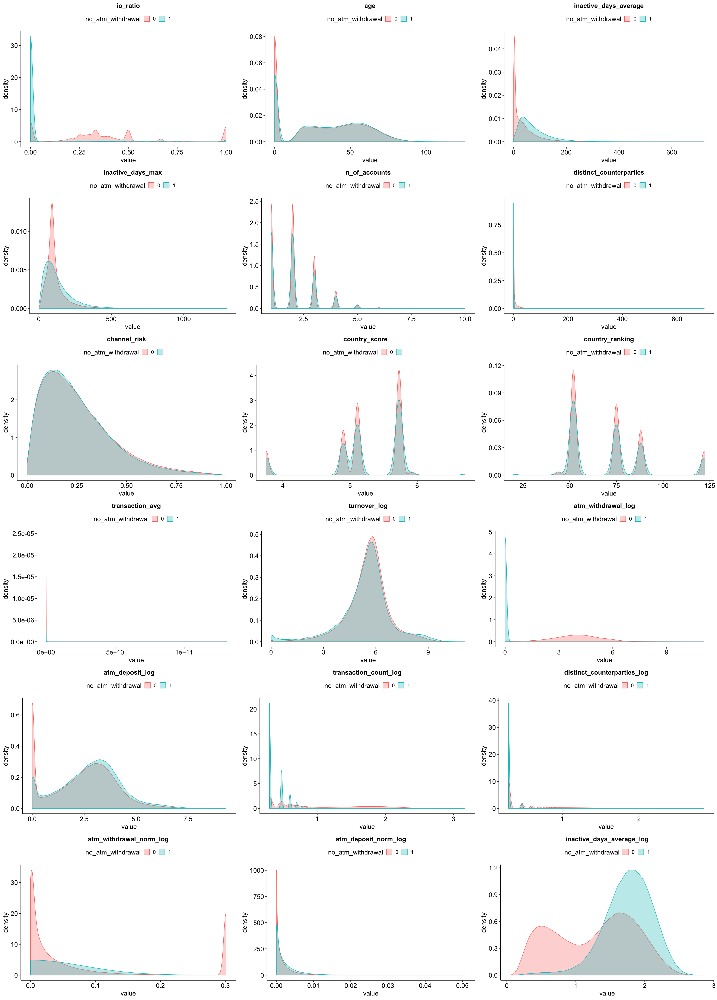

In [68]:
options(repr.plot.width = 28, repr.plot.height = 39)
ggarrange(plotlist=densplot_list_atm_withdrawal, ncol = 3, nrow = 6)

In [71]:
densplot_list_atm_deposit = lapply(other_columns, function(x){
    ggplot(AML_long %>% filter(variable == x), 
           aes(x = value, color = no_atm_deposit, fill = no_atm_deposit)) +
geom_density(alpha = .3) +
ggtitle(x)+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))
})

Warning message:
“Removed 456939 rows containing non-finite values (stat_density).”
Warning message:
“Removed 456939 rows containing non-finite values (stat_density).”


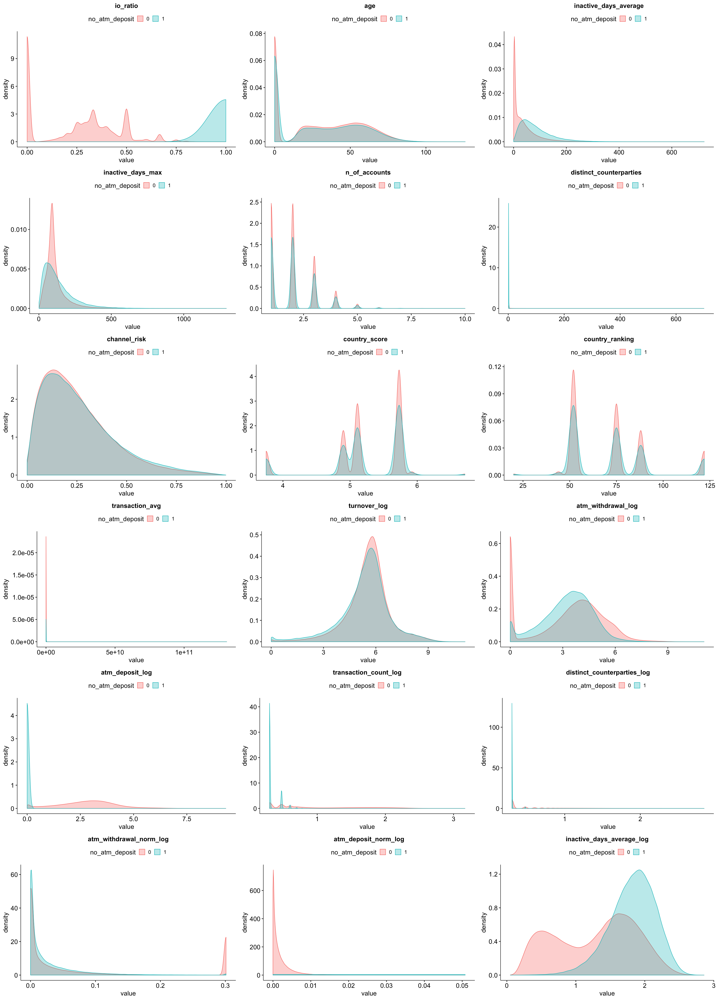

In [72]:
options(repr.plot.width = 28, repr.plot.height = 39)
ggarrange(plotlist=densplot_list_atm_deposit, ncol = 3, nrow = 6)

In [77]:
head(rownames(AML_long))

[1] "1" "2" "3" "4" "5" "6"

In [91]:
i = 1:3
test= col_combinations[i,]
test
test[1,]

io_ratio,age
io_ratio,inactive_days_average
io_ratio,inactive_days_max


[1] "io_ratio" "age"

In [96]:
slice = 1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

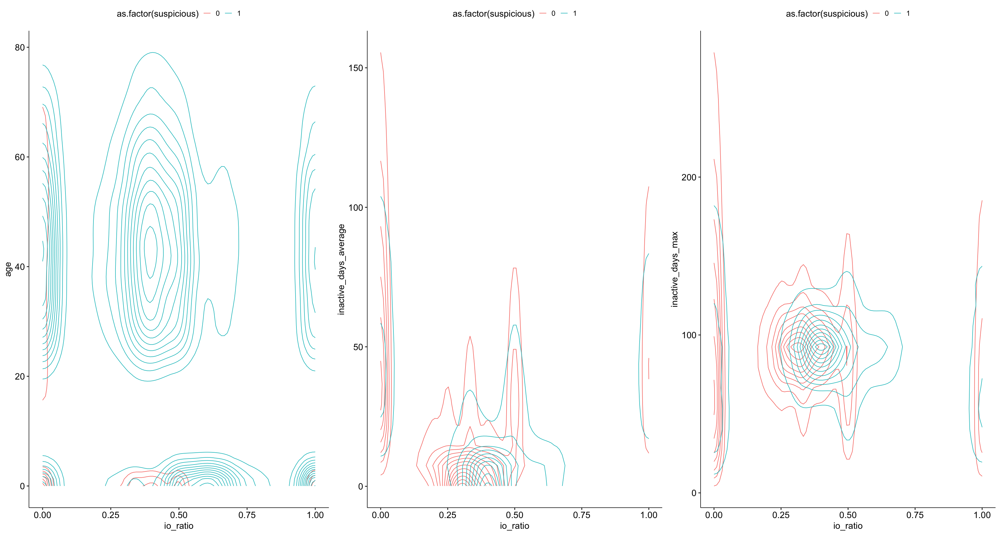

In [97]:
options(repr.plot.width = 28, repr.plot.height = 15)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [98]:
slice = 3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

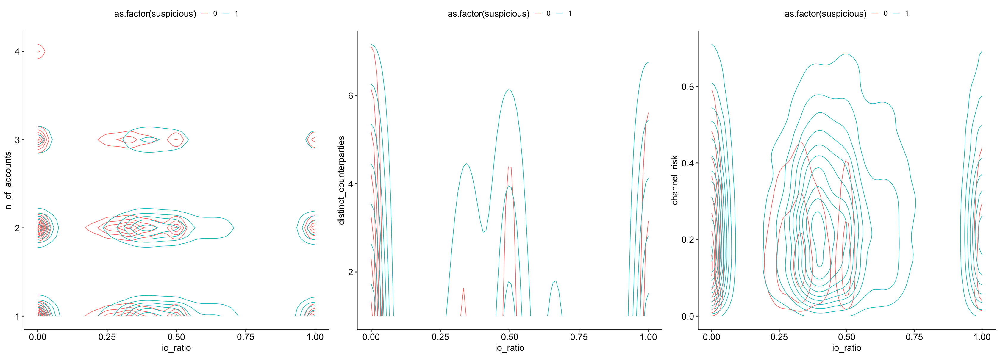

In [99]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [100]:
slice = 2*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

Warning message:
“Removed 456939 rows containing non-finite values (stat_density2d).”
Warning message:
“Removed 456939 rows containing non-finite values (stat_density2d).”


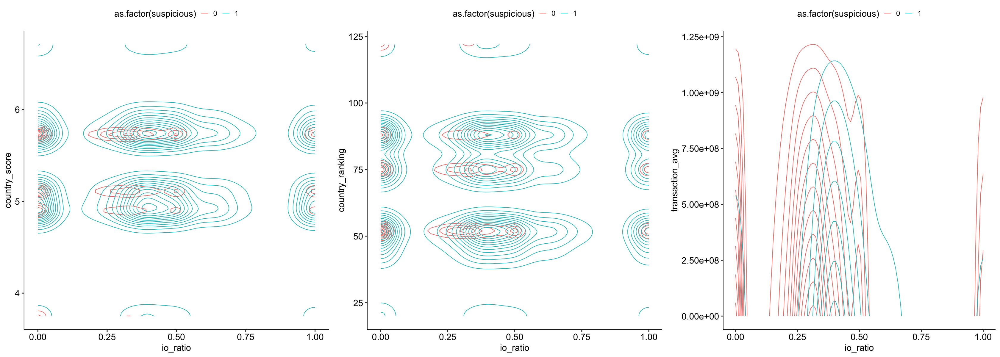

In [101]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [102]:
slice = 3*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

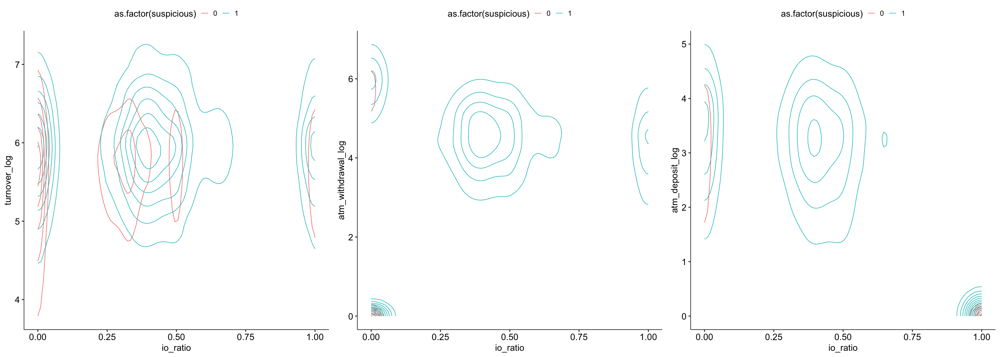

In [103]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [104]:
slice = 4*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

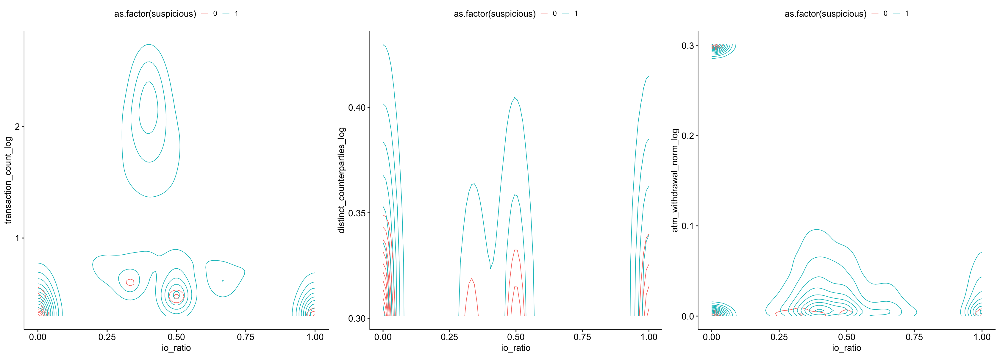

In [105]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [106]:
slice = 5*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

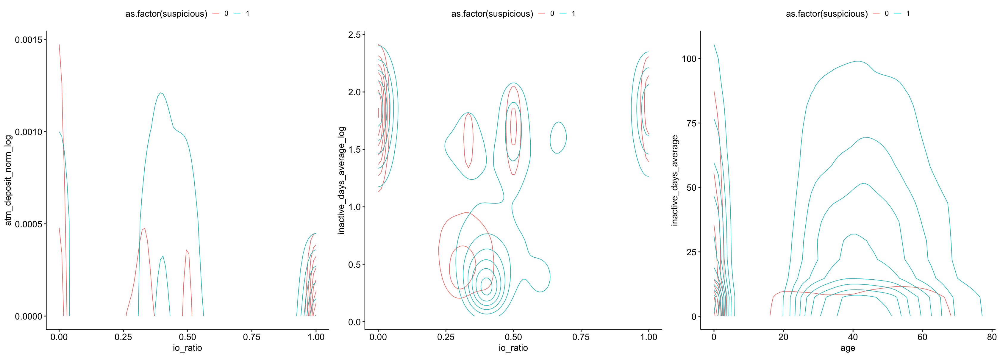

In [107]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [108]:
slice = 6*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

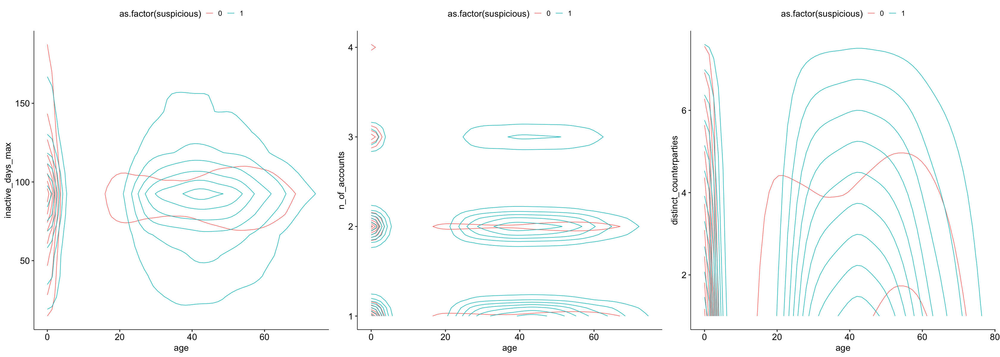

In [109]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [110]:
gc()

,used,(Mb),gc trigger,(Mb),limit (Mb),max used,(Mb)
Ncells,2136328,114.1,6363788,339.9,NA,12429271,663.8
Vcells,570704959,4354.2,1558340498,11889.2,16384,1558340498,11889.2


In [111]:
slice = 7*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

Warning message:
“Removed 456939 rows containing non-finite values (stat_density2d).”
Warning message:
“Removed 456939 rows containing non-finite values (stat_density2d).”


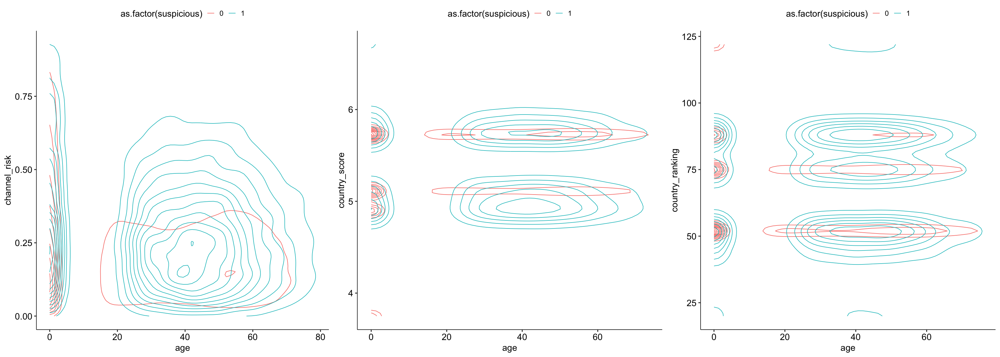

In [112]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [113]:
slice = 8*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

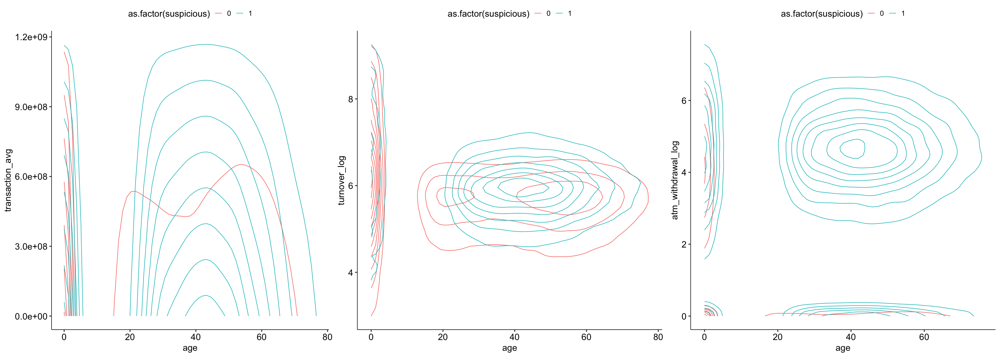

In [114]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [115]:
gc()

,used,(Mb),gc trigger,(Mb),limit (Mb),max used,(Mb)
Ncells,2136792,114.2,6363788,339.9,NA,12429271,663.8
Vcells,570707851,4354.2,1558763551,11892.5,16384,1558763551,11892.5


In [116]:
slice = 9*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

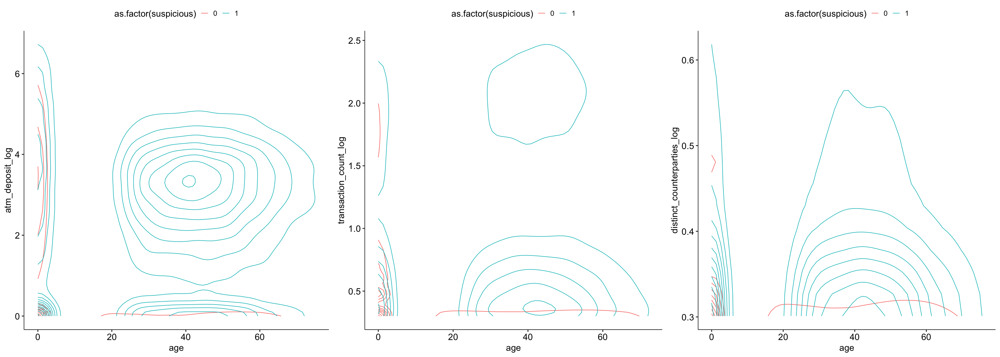

In [117]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [118]:
slice = 10*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [120]:
gc()

,used,(Mb),gc trigger,(Mb),limit (Mb),max used,(Mb)
Ncells,2278547,121.7,6363788,339.9,NA,12429271,663.8
Vcells,570998888,4356.4,1558763551,11892.5,16384,1558763551,11892.5


In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 11*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
gc()

In [ ]:
slice = 12*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 13*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
gc()

In [ ]:
slice = 14*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 15*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 16*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 17*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 18*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
gc()

In [ ]:
slice = 19*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 20*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
gc()

In [ ]:
slice = 21*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 22*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 23*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 24*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 25*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
gc()

In [ ]:
slice = 26*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 27*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 28*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 29*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 30*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
gc()

In [ ]:
slice = 31*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 32*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 33*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 34*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 35*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
gc()

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 36*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 37*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 38*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 39*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
gc()

In [ ]:
slice = 40*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 41*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 42*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 43*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 44*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 45*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
gc()

In [ ]:
slice = 46*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 47*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 48*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 49*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 50*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
gc()

In [ ]:
slice = 51*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 52*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 53*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 54*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
slice = 55*3+1:3

countour_plot_list = lapply(1:3, function(i){
ggplot(AML_loged, 
       aes_string(x = col_combinations[slice[i],1], y = col_combinations[slice[i],2]))+
 geom_density_2d(aes(colour = as.factor(suspicious)))+ 
theme_pubr(base_size = 18)+
  theme(plot.title = element_text(hjust = 0.5, size = 18, face = 'bold'))})

In [ ]:
options(repr.plot.width = 28, repr.plot.height = 10)
ggarrange(plotlist=countour_plot_list, ncol = 3)

In [ ]:
gc()